# Fig2 -- W2(t) only for Regular $3\times 3$

[GMM] Added .sample(n, seed) method.


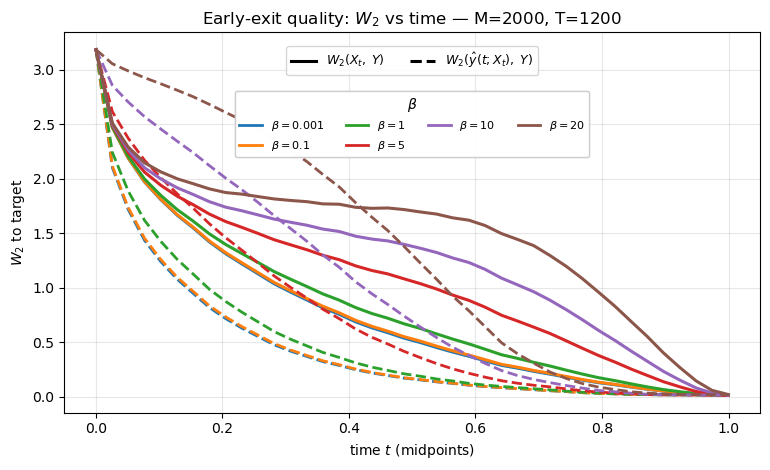

[saved] figs/early_exit_W2_vs_time_raw_M2000_T1200.png


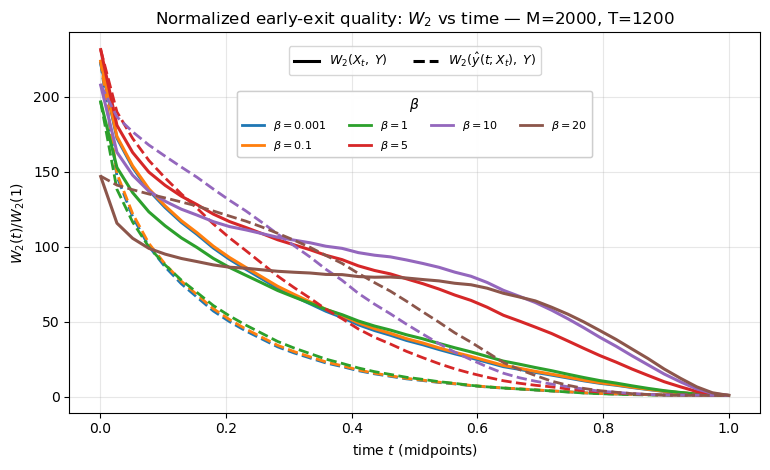

[saved] figs/early_exit_W2_vs_time_norm_M2000_T1200.png


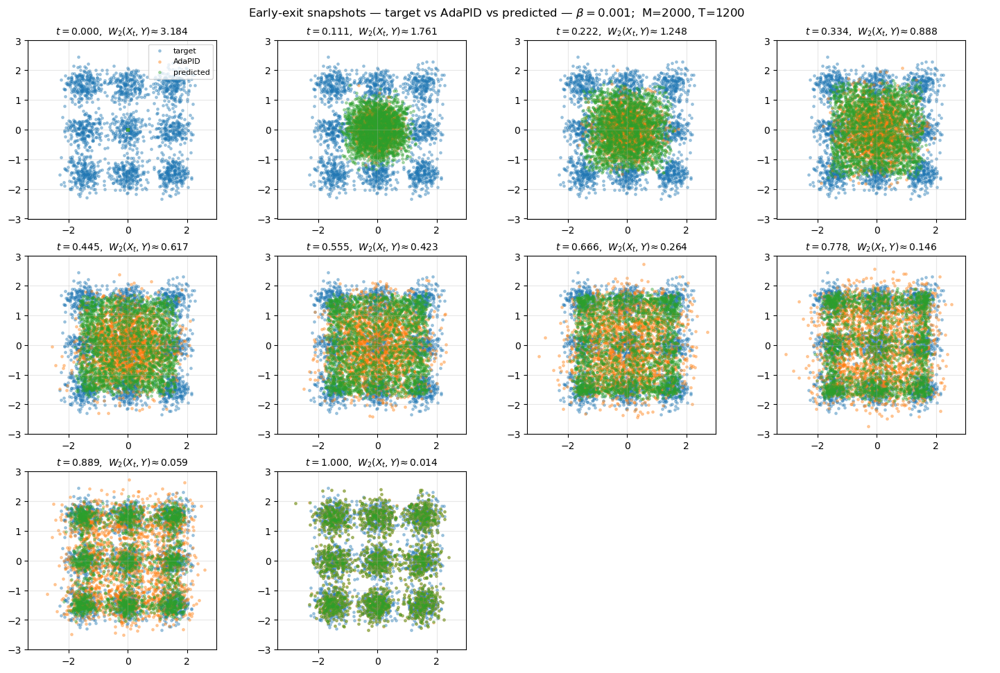

[saved] figs/early_exit_snapshots_beta0.001_M2000_T1200.png


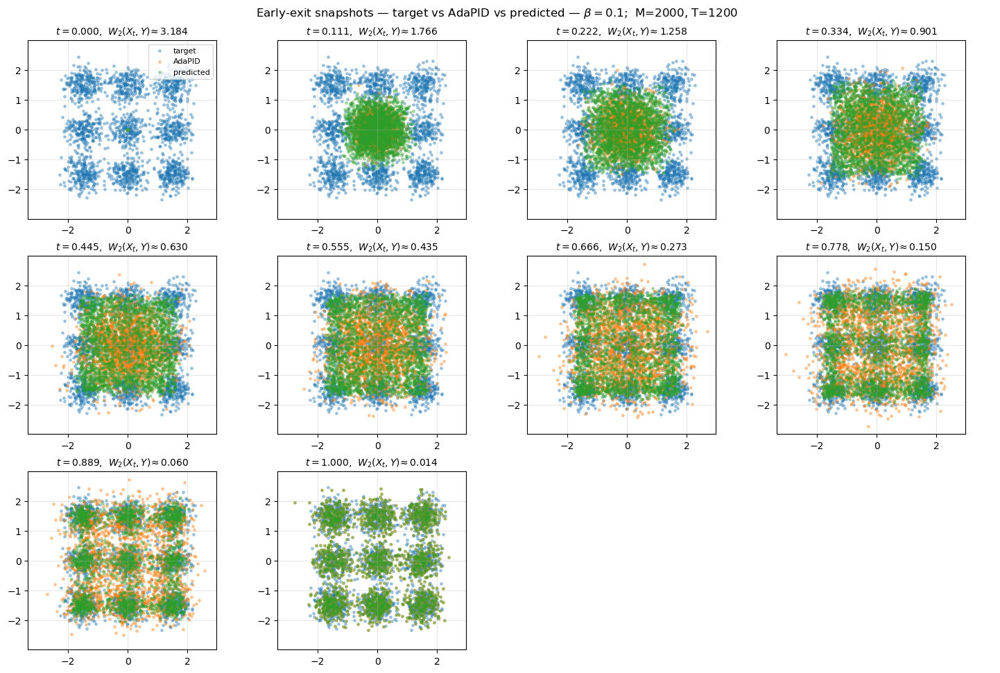

[saved] figs/early_exit_snapshots_beta0.1_M2000_T1200.png


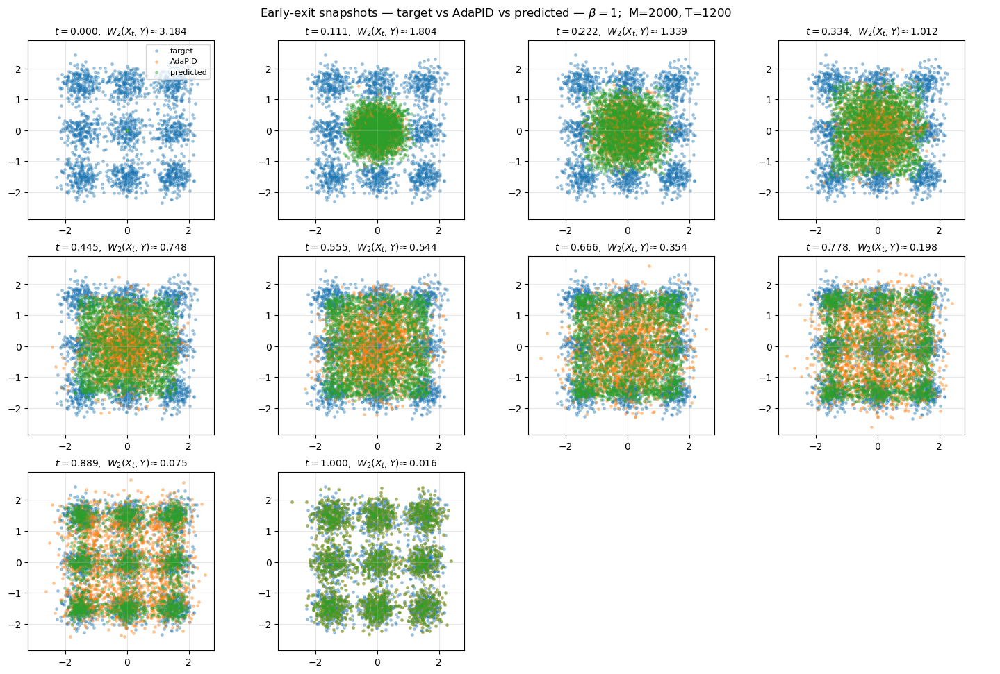

[saved] figs/early_exit_snapshots_beta1_M2000_T1200.png


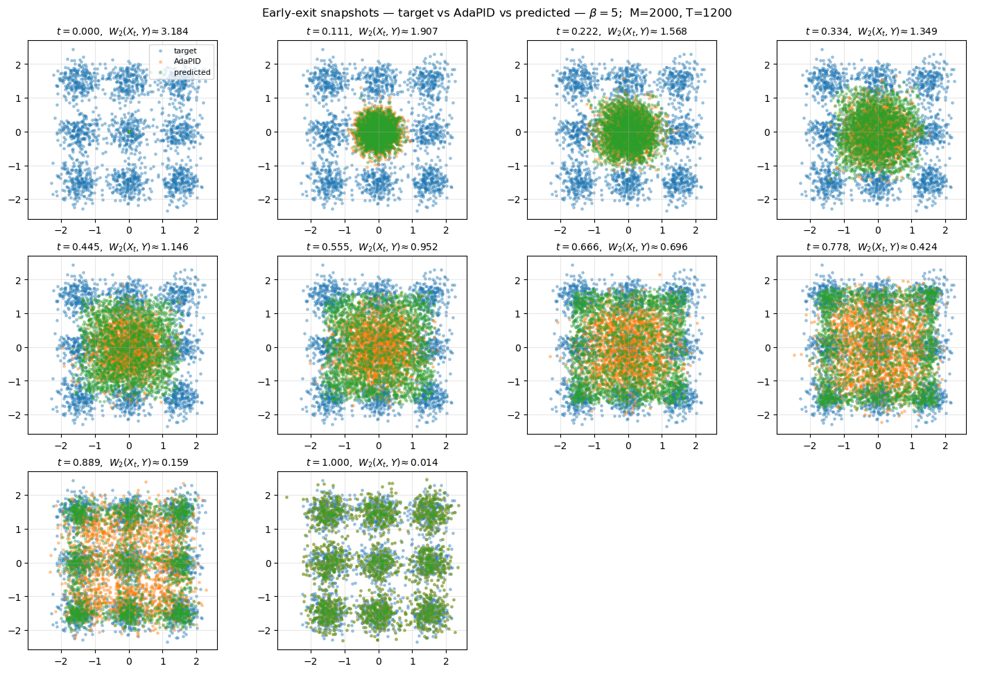

[saved] figs/early_exit_snapshots_beta5_M2000_T1200.png


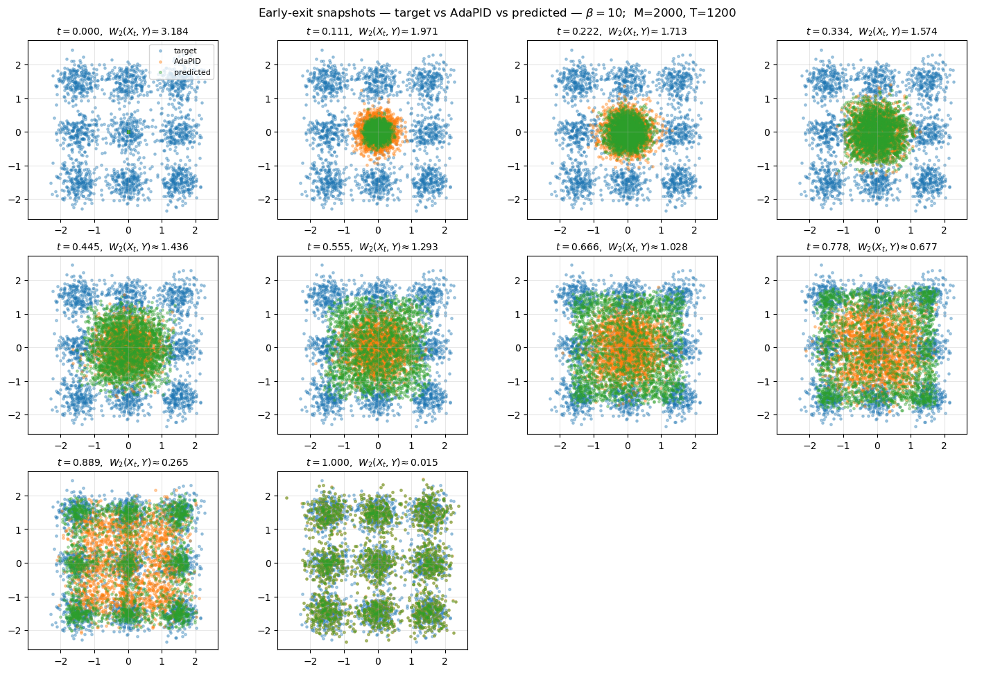

[saved] figs/early_exit_snapshots_beta10_M2000_T1200.png


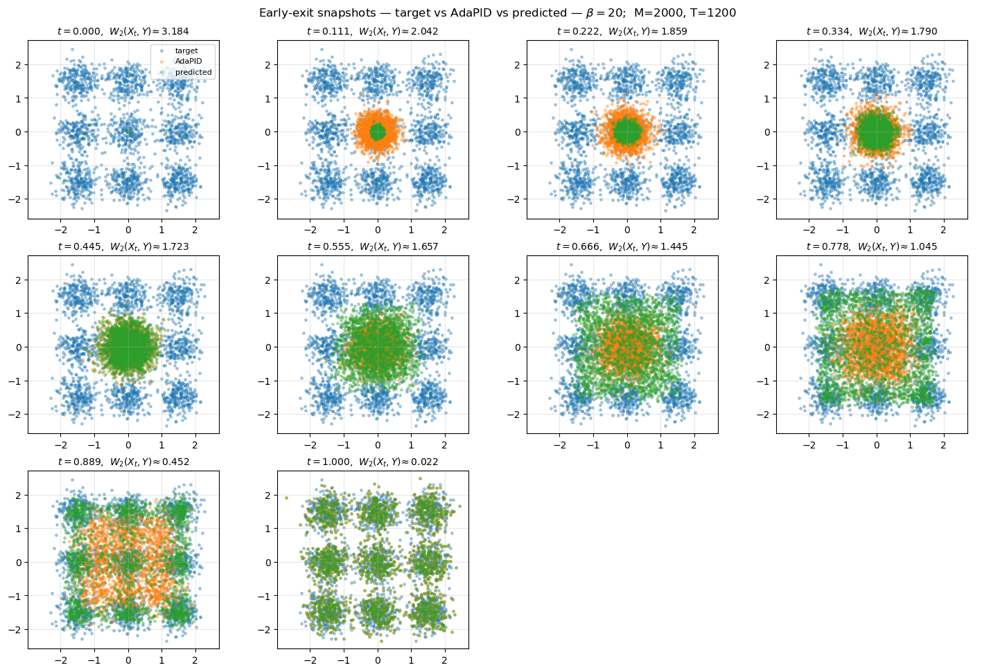

[saved] figs/early_exit_snapshots_beta20_M2000_T1200.png


In [1]:
import sys
#sys.path.append('/mnt/data')
from ada_api_clean import *


# =======================================================
# Early-exit W2(t) diagnostics (CRN + midpoint, x(0)=0)
#   • Tracks W2(p_{X_t}, p_tar) and W2(p_{ŷ_t}, p_tar) over time (denser sampling)
#   • Snapshot grids per β: scatter target (blue), state X_t (orange), predicted ŷ(t;X_t) (green)
#   • β grid = [0^+, 0.1, 1.0, 5.0, 10.0, 20.0] with 0^+=1e-3
#   • ENFORCE x(0) = 0
# =======================================================
import numpy as np
import matplotlib.pyplot as plt
import os, math

os.makedirs("figs", exist_ok=True)

# ---- target ----
try:
    gmm  # reuse if already defined
except NameError:
    try:
        gmm = make_grid_3x3(a=1.5, sigma=0.3)
    except NameError:
        xs = (-1.5, 0.0, 1.5)
        MU  = np.array([[xi, yj] for yj in xs for xi in xs], float)
        SIG = np.full(9, 0.3)
        PI  = np.ones(9)/9
        gmm = GMM(MU, SIG, PI)

assert gmm.d >= 2, "This visualization expects at least 2D target."

# ---- settings ----
DRIFT_SCHEME = "mid"                     # midpoint only here
seed_base = 12345
beta_eps = 1e-3                          # 0^+ to avoid singularities
betas = [beta_eps, 0.1, 1.0, 5.0, 10.0, 20.0]

# Resolution (increase T_eval for smoother trajectories)
M_eval = 2000
T_eval = 1200

# Dense W2 time sampling (for smoother curves)
N_W2 = 40
_W2_idx = np.linspace(0, T_eval-1, N_W2).round().astype(int)
W2_IDX = list(np.unique(np.clip(_W2_idx, 0, T_eval-1)))

# Snapshot times for scatter grids (keep moderate to avoid heavy plots)
N_SNAP = 10
_snap_idx = np.linspace(0, T_eval-1, N_SNAP).round().astype(int)
SNAP_IDX = list(np.unique(np.clip(_snap_idx, 0, T_eval-1)))

# Union of indices to collect in a single simulation pass
COLLECT_IDX = sorted(set(W2_IDX) | set(SNAP_IDX))

# ---- CRN seeds per (M,T) ----
def _seeds_for_MT(seed_base, M, T):
    seed_y   = int(seed_base + 1000003*M + 9176*T)
    seed_sim = int(seed_base + 1 + 2000003*M + 37*T)
    return seed_y, seed_sim

# ---- simulator: midpoint EM with x(0)=0, collecting at chosen midpoints ----
def simulate_paths_zero_init_collect(sched, gmm, M, T, seed, collect_idx):
    """
    Midpoint EM with X(0)=0.
    Returns:
      t_mid         : (T,)        full midpoint grid (n+0.5)/T
      collect_n     : list[int]   which step indices were collected
      X_list        : list[(M,d)] X at collected midpoints (BEFORE advancing)
      Yhat_list     : list[(M,d)] yhat(t_mid; X) at collected midpoints
    """
    rng = np.random.default_rng(seed)
    dt  = 1.0 / T
    d   = gmm.d
    X   = np.zeros((M, d), dtype=float)  # x(0)=0
    tmid = (np.arange(T) + 0.5) / T

    want = set(int(i) for i in collect_idx)
    collect_n, X_list, Yhat_list = [], [], []

    for n in range(T):
        t = (n + 0.5) / T

        # snapshot BEFORE advancing
        if n in want:
            yhat = yhat_oracle_gmm(X, float(t), sched, gmm)  # (M,d)
            collect_n.append(n)
            X_list.append(X.copy())
            Yhat_list.append(yhat.copy())

        # advance
        yhat = yhat_oracle_gmm(X, float(t), sched, gmm)
        a_m  = float(sched.a_minus(float(t)))
        b_m  = float(sched.b_minus(float(t)))
        u    = b_m * yhat - a_m * X
        dW   = rng.normal(size=X.shape) * math.sqrt(dt)
        X    = X + u * dt + dW

    return tmid, collect_n, X_list, Yhat_list

# ---- compute early-exit W2 curves and snapshots for one β (CRN, fixed Y_ref) ----
def early_exit_W2_curves_for_beta(beta, M, T, seed_base, Y_ref, w2_idx, snap_idx, collect_idx):
    seed_y, seed_sim = _seeds_for_MT(seed_base, M, T)
    sched = BetaSchedulePWC.constant(float(beta))
    _ = alpha_K_gamma_from_schedule(sched, 0.5)  # interior sanity

    tmid, collect_n, X_list, Yhat_list = simulate_paths_zero_init_collect(
        sched, gmm, M=M, T=T, seed=seed_sim, collect_idx=collect_idx
    )

    # map collected index -> (X, Yhat, t)
    idx_to_pack = {int(n): (X_list[i], Yhat_list[i], tmid[int(n)]) for i, n in enumerate(collect_n)}

    # curves (denser points)
    t_w2, W2x, W2yhat = [], [], []
    for n in w2_idx:
        Xs, Ys_hat, tt = idx_to_pack[int(n)]
        w2x, _ = w2_empirical(Xs, Y_ref, prefer_hungarian=True)
        w2y, _ = w2_empirical(Ys_hat, Y_ref, prefer_hungarian=True)
        t_w2.append(float(tt))
        W2x.append(float(w2x))
        W2yhat.append(float(w2y))

    t_w2 = np.array(t_w2, float)
    W2x  = np.array(W2x, float)
    W2yhat = np.array(W2yhat, float)

    # snapshots for scatter grids
    t_snap, X_snaps, Yhat_snaps, W2_snap = [], [], [], []
    for n in snap_idx:
        Xs, Ys_hat, tt = idx_to_pack[int(n)]
        w2s, _ = w2_empirical(Xs, Y_ref, prefer_hungarian=True)
        t_snap.append(float(tt))
        X_snaps.append(Xs)
        Yhat_snaps.append(Ys_hat)
        W2_snap.append(float(w2s))

    return {
        "t_w2": t_w2,
        "W2x": W2x,
        "W2yhat": W2yhat,
        "t_snap": np.array(t_snap, float),
        "X_snaps": X_snaps,
        "Yhat_snaps": Yhat_snaps,
        "W2_snap": np.array(W2_snap, float),
        "sched": sched,
    }

# ---- target reference (CRN) ----
seed_y_ref, seed_sim_ref = _seeds_for_MT(seed_base, M_eval, T_eval)
rngY = np.random.default_rng(seed_y_ref)
Y_ref, _ = sample_gmm(gmm, M_eval, rngY)

# ---- evaluate across betas ----
results = {}
for b in betas:
    results[float(b)] = early_exit_W2_curves_for_beta(
        beta=float(b), M=M_eval, T=T_eval, seed_base=seed_base,
        Y_ref=Y_ref, w2_idx=W2_IDX, snap_idx=SNAP_IDX, collect_idx=COLLECT_IDX
    )

# =================== FIGURE 1: raw W2(t) (state solid, predicted dashed) ===================
colors = plt.rcParams["axes.prop_cycle"].by_key()["color"]
beta_cols = {float(b): colors[i % len(colors)] for i, b in enumerate(betas)}

fig, ax = plt.subplots(figsize=(7.8, 4.8))

# style legend at top-center
style_handles = [
    plt.Line2D([0],[0], color="k", lw=2.2, ls="-"),
    plt.Line2D([0],[0], color="k", lw=2.2, ls="--"),
]
style_labels = [r"$W_2(X_t,\;Y)$", r"$W_2(\hat y(t;X_t),\;Y)$"]
leg_style = ax.legend(style_handles, style_labels, loc="upper center",
                      bbox_to_anchor=(0.5, 0.98), ncol=2, frameon=True, fontsize=9)
ax.add_artist(leg_style)

# β curves + β legend placed below style legend (inside)
beta_handles, beta_labels = [], []
for b in betas:
    s = results[float(b)]
    # sort by time in case of numerical ordering issues
    order = np.argsort(s["t_w2"])
    ax.plot(s["t_w2"][order], s["W2x"][order], lw=2.2, ls="-",  color=beta_cols[float(b)])
    ax.plot(s["t_w2"][order], s["W2yhat"][order], lw=2.0, ls="--", color=beta_cols[float(b)])
    beta_handles.append(plt.Line2D([0],[0], color=beta_cols[float(b)], lw=2.0))
    beta_labels.append(fr"$\beta={float(b):.3g}$")

leg_beta = ax.legend(beta_handles, beta_labels, loc="upper center",
                     bbox_to_anchor=(0.5, 0.86), ncol=min(4,len(betas)),
                     frameon=True, framealpha=0.9, fontsize=8, title=r"$\beta$")
ax.add_artist(leg_beta)

ax.set_xlabel("time $t$ (midpoints)")
ax.set_ylabel(r"$W_2$ to target")
ax.set_title(fr"Early-exit quality: $W_2$ vs time — M={M_eval}, T={T_eval}")
ax.grid(True, alpha=0.3)
plt.tight_layout()
fname_raw = f"figs/early_exit_W2_vs_time_raw_M{M_eval}_T{T_eval}.png"
plt.savefig(fname_raw, dpi=300, bbox_inches="tight"); plt.show(); print("[saved]", fname_raw)

# =================== FIGURE 2: normalized W2(t)/W2(1) ===================
fig, ax = plt.subplots(figsize=(7.8, 4.8))

# legends (same placement)
leg_style = ax.legend(style_handles, style_labels, loc="upper center",
                      bbox_to_anchor=(0.5, 0.98), ncol=2, frameon=True, fontsize=9)
ax.add_artist(leg_style)

beta_handles, beta_labels = [], []
for b in betas:
    s = results[float(b)]
    order = np.argsort(s["t_w2"])
    denom_x = s["W2x"][order][-1] if s["W2x"][order][-1] > 0 else 1.0
    denom_y = s["W2yhat"][order][-1] if s["W2yhat"][order][-1] > 0 else 1.0
    ax.plot(s["t_w2"][order], s["W2x"][order]/denom_x, lw=2.2, ls="-",  color=beta_cols[float(b)])
    ax.plot(s["t_w2"][order], s["W2yhat"][order]/denom_y, lw=2.0, ls="--", color=beta_cols[float(b)])
    beta_handles.append(plt.Line2D([0],[0], color=beta_cols[float(b)], lw=2.0))
    beta_labels.append(fr"$\beta={float(b):.3g}$")

leg_beta = ax.legend(beta_handles, beta_labels, loc="upper center",
                     bbox_to_anchor=(0.5, 0.86), ncol=min(4,len(betas)),
                     frameon=True, framealpha=0.9, fontsize=8, title=r"$\beta$")
ax.add_artist(leg_beta)

ax.set_xlabel("time $t$ (midpoints)")
ax.set_ylabel(r"$W_2(t)/W_2(1)$")
ax.set_title(fr"Normalized early-exit quality: $W_2$ vs time — M={M_eval}, T={T_eval}")
ax.grid(True, alpha=0.3)
plt.tight_layout()
fname_norm = f"figs/early_exit_W2_vs_time_norm_M{M_eval}_T{T_eval}.png"
plt.savefig(fname_norm, dpi=300, bbox_inches="tight"); plt.show(); print("[saved]", fname_norm)

# =================== SNAPSHOT GRIDS PER β: scatter(Y, X_t, ŷ_t) with W2 ===================
def _compute_axis_limits(points_list, margin=0.05):
    """points_list: list of (N,2) arrays"""
    P = np.vstack(points_list)
    xmin, ymin = np.min(P, axis=0)
    xmax, ymax = np.max(P, axis=0)
    dx = xmax - xmin; dy = ymax - ymin
    if dx <= 0: dx = 1.0
    if dy <= 0: dy = 1.0
    xmin -= margin*dx; xmax += margin*dx
    ymin -= margin*dy; ymax += margin*dy
    return xmin, xmax, ymin, ymax

def plot_snapshot_grid_for_beta(beta, res, Y_ref, max_cols=4):
    t_snap = res["t_snap"]
    X_snaps = res["X_snaps"]
    Yhat_snaps = res["Yhat_snaps"]
    W2x = res["W2_snap"]

    S = len(t_snap)
    ncols = min(max_cols, S)
    nrows = int(np.ceil(S / ncols))

    # axis limits across all panels (include target + state + predicted)
    lims = _compute_axis_limits([Y_ref] + X_snaps + Yhat_snaps)

    fig, axes = plt.subplots(nrows, ncols, figsize=(3.6*ncols, 3.2*nrows),
                             squeeze=False, constrained_layout=True)
    axes = axes.ravel()

    for i in range(S):
        ax = axes[i]
        # target (blue), state (orange), predicted (green)
        ax.scatter(Y_ref[:,0], Y_ref[:,1], s=6, alpha=0.35, label="target")
        ax.scatter(X_snaps[i][:,0], X_snaps[i][:,1], s=6, alpha=0.35, label="AdaPID")
        ax.scatter(Yhat_snaps[i][:,0], Yhat_snaps[i][:,1], s=6, alpha=0.35, label="predicted", c="tab:green")
        ax.set_title(fr"$t={t_snap[i]:.3f}$,  $W_2(X_t,Y)\!\approx{W2x[i]:.3f}$", fontsize=10)
        ax.set_xlim(lims[0], lims[1]); ax.set_ylim(lims[2], lims[3])
        ax.set_aspect("equal", adjustable="box")
        ax.grid(True, alpha=0.3)
        if i == 0:
            ax.legend(loc="upper right", fontsize=8, frameon=True)

    # hide any unused axes
    for j in range(S, nrows*ncols):
        axes[j].axis("off")

    fig.suptitle(fr"Early-exit snapshots — target vs AdaPID vs predicted — $\beta={float(beta):.3g}$;  M={M_eval}, T={T_eval}",
                 fontsize=12)
    fname = f"figs/early_exit_snapshots_beta{float(beta):.3g}_M{M_eval}_T{T_eval}.png"
    fig.savefig(fname, dpi=300, bbox_inches="tight")
    plt.show(); print("[saved]", fname)

for b in betas:
    plot_snapshot_grid_for_beta(b, results[float(b)], Y_ref)

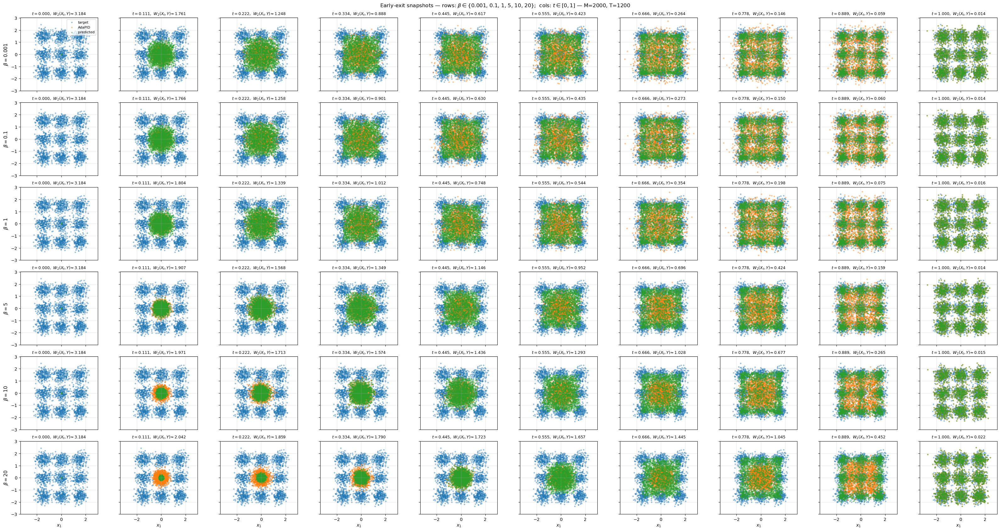

[saved] figs/early_exit_snapshots_grid_ALL_betas_M2000_T1200.png


In [17]:
# =======================================================
# ONE BIG SNAPSHOT FIGURE: rows = β, cols = snapshot times
#   • Each panel: target (blue), X_t (orange), predicted ŷ(t;X_t) (green)
#   • Title in each panel shows time t and W2(X_t, Y)
#   • One legend in the top-left panel; per-row ylabel shows β
# =======================================================

def _global_axis_limits_for_all(results, betas, Y_ref, margin=0.05):
    pts = [Y_ref]
    for b in betas:
        r = results[float(b)]
        pts += r["X_snaps"]
        pts += r["Yhat_snaps"]
    P = np.vstack(pts)
    xmin, ymin = np.min(P, axis=0)
    xmax, ymax = np.max(P, axis=0)
    dx = xmax - xmin; dy = ymax - ymin
    if dx <= 0: dx = 1.0
    if dy <= 0: dy = 1.0
    xmin -= margin*dx; xmax += margin*dx
    ymin -= margin*dy; ymax += margin*dy
    return xmin, xmax, ymin, ymax

def plot_all_betas_snapshot_grid(results, betas, Y_ref, figure_tag="all"):
    # assume all betas share the same snapshot index set length S
    S = len(results[float(betas[0])]["t_snap"])
    R = len(betas)

    # global axis limits so rows are comparable
    xmin, xmax, ymin, ymax = _global_axis_limits_for_all(results, betas, Y_ref, margin=0.05)

    # pick a compact but readable size
    # width grows with columns, height with rows
    fig_w = max(3.2 * S, 6.4)
    fig_h = max(2.8 * R, 3.6)
    fig, axes = plt.subplots(R, S, figsize=(fig_w, fig_h), squeeze=False, constrained_layout=True)

    for i, b in enumerate(betas):
        r = results[float(b)]
        t_snap = r["t_snap"]
        X_snaps = r["X_snaps"]
        Yhat_snaps = r["Yhat_snaps"]
        W2_snap = r["W2_snap"]

        # row label (β) on the left-most axis
        axes[i,0].set_ylabel(rf"$\beta={float(b):.3g}$", rotation=90, fontsize=11)

        for j in range(S):
            ax = axes[i, j]
            # target (blue), state (orange), predicted (green)
            ax.scatter(Y_ref[:,0], Y_ref[:,1], s=6, alpha=0.35, label="target")
            ax.scatter(X_snaps[j][:,0], X_snaps[j][:,1], s=6, alpha=0.35, label="AdaPID")
            ax.scatter(Yhat_snaps[j][:,0], Yhat_snaps[j][:,1], s=6, alpha=0.35, c="tab:green", label="predicted")

            ax.set_xlim(xmin, xmax); ax.set_ylim(ymin, ymax)
            ax.set_aspect("equal", adjustable="box")
            ax.grid(True, alpha=0.3)
            ax.set_title(fr"$t={t_snap[j]:.3f}$,  $W_2(X_t,Y)\!\approx{W2_snap[j]:.3f}$", fontsize=9)

            # only the bottom row gets x-labels to keep things tidy
            if i == R-1:
                ax.set_xlabel("$x_1$")
            else:
                ax.set_xticklabels([])
            # only the first column keeps y tick labels
            if j != 0:
                ax.set_yticklabels([])

    # single legend in the top-left panel
    axes[0,0].legend(loc="upper right", fontsize=8, frameon=True)

    fig.suptitle(
        fr"Early-exit snapshots — rows: $\beta\in${{{', '.join(f'{float(b):.3g}' for b in betas)}}};  cols: $t\in[0,1]$ — "
        fr"M={M_eval}, T={T_eval}",
        fontsize=12
    )

    out = f"figs/early_exit_snapshots_{figure_tag}_ALL_betas_M{M_eval}_T{T_eval}.png"
    fig.savefig(out, dpi=300, bbox_inches="tight")
    plt.show(); print("[saved]", out)

# build the combined figure
plot_all_betas_snapshot_grid(results, betas, Y_ref, figure_tag="grid")

# Attempt to build the first figure for perturbed grids (Pert A)

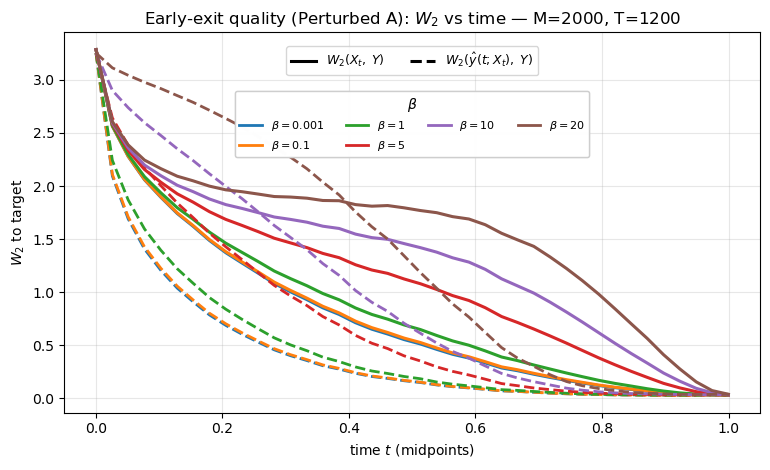

[saved] figs/early_exit_PertA_W2_vs_time_raw_M2000_T1200.png


In [18]:
import sys
#sys.path.append('/mnt/data')
from ada_api_clean import *


# =======================================================
# Early-exit W2(t) diagnostics (CRN + midpoint, x(0)=0)
#   • Tracks W2(p_{X_t}, p_tar) and W2(p_{ŷ_t}, p_tar) over time (denser sampling)
#   • Snapshot grids per β: scatter target (blue), state X_t (orange), predicted ŷ(t;X_t) (green)
#   • β grid = [0^+, 0.1, 1.0, 5.0, 10.0, 20.0] with 0^+=1e-3
#   • ENFORCE x(0) = 0
# =======================================================
import numpy as np
import matplotlib.pyplot as plt
import os, math

os.makedirs("figs", exist_ok=True)

# -------------------- Models (reuse) --------------------
def build_regular_grid_gmm(a=1.5, sigma=0.3):
    xs = np.array([-a, 0.0, a], float)
    MU  = np.array([[xi, yj] for yj in xs for xi in xs], float)
    SIG = np.full(9, float(sigma))
    PI  = np.ones(9, float)/9.0
    return GMM(MU, SIG, PI)

def build_perturbed_gmm(seed, a=1.5, base_sigma=0.3,
                        jitter_frac=1/3, sig_scale=(0.5, 2.0),
                        weight_range=(0.5, 1.5)):
    rng = np.random.default_rng(int(seed))
    xs = np.array([-a, 0.0, a], float)
    centers = np.array([[xi, yj] for yj in xs for xi in xs], float)
    jitter_max = a * float(jitter_frac)
    MU  = centers + rng.uniform(-jitter_max, jitter_max, size=centers.shape)
    SIG = base_sigma * rng.uniform(sig_scale[0], sig_scale[1], size=9)
    w   = rng.uniform(weight_range[0], weight_range[1], size=9)
    PI  = w / np.sum(w)
    return GMM(MU, SIG, PI)

try:
    _ = regular; _ = pertA; _ = pertB
except NameError:
    regular = build_regular_grid_gmm(a=1.5, sigma=0.3)
    pertA   = build_perturbed_gmm(seed=20241005, a=1.5, base_sigma=0.3)
    pertB   = build_perturbed_gmm(seed=20241006, a=1.5, base_sigma=0.3)

models  = [("Regular 3×3", regular), ("Perturbed A", pertA), ("Perturbed B", pertB)]

gmm = pertA

# ---- settings ----
DRIFT_SCHEME = "mid"                     # midpoint only here
seed_base = 12345
beta_eps = 1e-3                          # 0^+ to avoid singularities
betas = [beta_eps, 0.1, 1.0, 5.0, 10.0, 20.0]

# Resolution (increase T_eval for smoother trajectories)
M_eval = 2000
T_eval = 1200

# Dense W2 time sampling (for smoother curves)
N_W2 = 40
_W2_idx = np.linspace(0, T_eval-1, N_W2).round().astype(int)
W2_IDX = list(np.unique(np.clip(_W2_idx, 0, T_eval-1)))

# Snapshot times for scatter grids (keep moderate to avoid heavy plots)
N_SNAP = 10
_snap_idx = np.linspace(0, T_eval-1, N_SNAP).round().astype(int)
SNAP_IDX = list(np.unique(np.clip(_snap_idx, 0, T_eval-1)))

# Union of indices to collect in a single simulation pass
COLLECT_IDX = sorted(set(W2_IDX) | set(SNAP_IDX))

# ---- CRN seeds per (M,T) ----
def _seeds_for_MT(seed_base, M, T):
    seed_y   = int(seed_base + 1000003*M + 9176*T)
    seed_sim = int(seed_base + 1 + 2000003*M + 37*T)
    return seed_y, seed_sim

# ---- simulator: midpoint EM with x(0)=0, collecting at chosen midpoints ----
def simulate_paths_zero_init_collect(sched, gmm, M, T, seed, collect_idx):
    """
    Midpoint EM with X(0)=0.
    Returns:
      t_mid         : (T,)        full midpoint grid (n+0.5)/T
      collect_n     : list[int]   which step indices were collected
      X_list        : list[(M,d)] X at collected midpoints (BEFORE advancing)
      Yhat_list     : list[(M,d)] yhat(t_mid; X) at collected midpoints
    """
    rng = np.random.default_rng(seed)
    dt  = 1.0 / T
    d   = gmm.d
    X   = np.zeros((M, d), dtype=float)  # x(0)=0
    tmid = (np.arange(T) + 0.5) / T

    want = set(int(i) for i in collect_idx)
    collect_n, X_list, Yhat_list = [], [], []

    for n in range(T):
        t = (n + 0.5) / T

        # snapshot BEFORE advancing
        if n in want:
            yhat = yhat_oracle_gmm(X, float(t), sched, gmm)  # (M,d)
            collect_n.append(n)
            X_list.append(X.copy())
            Yhat_list.append(yhat.copy())

        # advance
        yhat = yhat_oracle_gmm(X, float(t), sched, gmm)
        a_m  = float(sched.a_minus(float(t)))
        b_m  = float(sched.b_minus(float(t)))
        u    = b_m * yhat - a_m * X
        dW   = rng.normal(size=X.shape) * math.sqrt(dt)
        X    = X + u * dt + dW

    return tmid, collect_n, X_list, Yhat_list

# ---- compute early-exit W2 curves and snapshots for one β (CRN, fixed Y_ref) ----
def early_exit_W2_curves_for_beta(beta, M, T, seed_base, Y_ref, w2_idx, snap_idx, collect_idx):
    seed_y, seed_sim = _seeds_for_MT(seed_base, M, T)
    sched = BetaSchedulePWC.constant(float(beta))
    _ = alpha_K_gamma_from_schedule(sched, 0.5)  # interior sanity

    tmid, collect_n, X_list, Yhat_list = simulate_paths_zero_init_collect(
        sched, gmm, M=M, T=T, seed=seed_sim, collect_idx=collect_idx
    )

    # map collected index -> (X, Yhat, t)
    idx_to_pack = {int(n): (X_list[i], Yhat_list[i], tmid[int(n)]) for i, n in enumerate(collect_n)}

    # curves (denser points)
    t_w2, W2x, W2yhat = [], [], []
    for n in w2_idx:
        Xs, Ys_hat, tt = idx_to_pack[int(n)]
        w2x, _ = w2_empirical(Xs, Y_ref, prefer_hungarian=True)
        w2y, _ = w2_empirical(Ys_hat, Y_ref, prefer_hungarian=True)
        t_w2.append(float(tt))
        W2x.append(float(w2x))
        W2yhat.append(float(w2y))

    t_w2 = np.array(t_w2, float)
    W2x  = np.array(W2x, float)
    W2yhat = np.array(W2yhat, float)

    # snapshots for scatter grids
    t_snap, X_snaps, Yhat_snaps, W2_snap = [], [], [], []
    for n in snap_idx:
        Xs, Ys_hat, tt = idx_to_pack[int(n)]
        w2s, _ = w2_empirical(Xs, Y_ref, prefer_hungarian=True)
        t_snap.append(float(tt))
        X_snaps.append(Xs)
        Yhat_snaps.append(Ys_hat)
        W2_snap.append(float(w2s))

    return {
        "t_w2": t_w2,
        "W2x": W2x,
        "W2yhat": W2yhat,
        "t_snap": np.array(t_snap, float),
        "X_snaps": X_snaps,
        "Yhat_snaps": Yhat_snaps,
        "W2_snap": np.array(W2_snap, float),
        "sched": sched,
    }

# ---- target reference (CRN) ----
seed_y_ref, seed_sim_ref = _seeds_for_MT(seed_base, M_eval, T_eval)
rngY = np.random.default_rng(seed_y_ref)
Y_ref, _ = sample_gmm(gmm, M_eval, rngY)

# ---- evaluate across betas ----
results = {}
for b in betas:
    results[float(b)] = early_exit_W2_curves_for_beta(
        beta=float(b), M=M_eval, T=T_eval, seed_base=seed_base,
        Y_ref=Y_ref, w2_idx=W2_IDX, snap_idx=SNAP_IDX, collect_idx=COLLECT_IDX
    )

# =================== FIGURE 1: raw W2(t) (state solid, predicted dashed) ===================
colors = plt.rcParams["axes.prop_cycle"].by_key()["color"]
beta_cols = {float(b): colors[i % len(colors)] for i, b in enumerate(betas)}

fig, ax = plt.subplots(figsize=(7.8, 4.8))

# style legend at top-center
style_handles = [
    plt.Line2D([0],[0], color="k", lw=2.2, ls="-"),
    plt.Line2D([0],[0], color="k", lw=2.2, ls="--"),
]
style_labels = [r"$W_2(X_t,\;Y)$", r"$W_2(\hat y(t;X_t),\;Y)$"]
leg_style = ax.legend(style_handles, style_labels, loc="upper center",
                      bbox_to_anchor=(0.5, 0.98), ncol=2, frameon=True, fontsize=9)
ax.add_artist(leg_style)

# β curves + β legend placed below style legend (inside)
beta_handles, beta_labels = [], []
for b in betas:
    s = results[float(b)]
    # sort by time in case of numerical ordering issues
    order = np.argsort(s["t_w2"])
    ax.plot(s["t_w2"][order], s["W2x"][order], lw=2.2, ls="-",  color=beta_cols[float(b)])
    ax.plot(s["t_w2"][order], s["W2yhat"][order], lw=2.0, ls="--", color=beta_cols[float(b)])
    beta_handles.append(plt.Line2D([0],[0], color=beta_cols[float(b)], lw=2.0))
    beta_labels.append(fr"$\beta={float(b):.3g}$")

leg_beta = ax.legend(beta_handles, beta_labels, loc="upper center",
                     bbox_to_anchor=(0.5, 0.86), ncol=min(4,len(betas)),
                     frameon=True, framealpha=0.9, fontsize=8, title=r"$\beta$")
ax.add_artist(leg_beta)

ax.set_xlabel("time $t$ (midpoints)")
ax.set_ylabel(r"$W_2$ to target")
ax.set_title(fr"Early-exit quality (Perturbed A): $W_2$ vs time — M={M_eval}, T={T_eval}")
ax.grid(True, alpha=0.3)
plt.tight_layout()
fname_raw = f"figs/early_exit_PertA_W2_vs_time_raw_M{M_eval}_T{T_eval}.png"
plt.savefig(fname_raw, dpi=300, bbox_inches="tight"); plt.show(); print("[saved]", fname_raw)


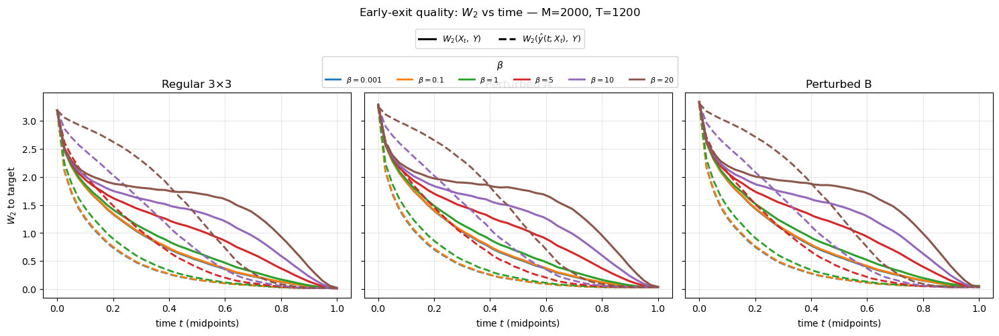

[saved] figs/early_exit_W2_vs_time_raw_M2000_T1200_3models.png


In [19]:
# ==== NEW CELL: 3-panel W2(t) for Regular, PertA, PertB (same computations; just plotting) ====
# Assumes the previous cell has already defined:
#   regular, pertA, pertB, gmm
#   _seeds_for_MT, simulate_paths_zero_init_collect, early_exit_W2_curves_for_beta
#   betas, M_eval, T_eval, W2_IDX, SNAP_IDX, COLLECT_IDX, seed_base, BetaSchedulePWC, etc.
# Uses the very same computations, only loops over models and plots them side-by-side.

import numpy as np
import matplotlib.pyplot as plt
import os

os.makedirs("figs", exist_ok=True)

# --- three models (same objects you used above) ---
MODEL_TUPLES = [
    ("Regular 3×3", regular),
    ("Perturbed A",  pertA),
    ("Perturbed B",  pertB),
]

# --- helper: run your exact pipeline for a given GMM by reusing your functions/logic ---
def _compute_results_for_gmm(gmm_obj):
    """
    Reuse your exact computations by setting the global `gmm` to gmm_obj,
    sampling Y_ref with your CRN seed, and calling early_exit_W2_curves_for_beta.
    """
    global gmm
    gmm_backup = gmm
    gmm = gmm_obj

    # target reference (CRN) exactly as in your cell
    seed_y_ref, _ = _seeds_for_MT(seed_base, M_eval, T_eval)
    rngY = np.random.default_rng(seed_y_ref)
    Y_ref, _ = sample_gmm(gmm, M_eval, rngY)

    res = {}
    for b in betas:
        res[float(b)] = early_exit_W2_curves_for_beta(
            beta=float(b), M=M_eval, T=T_eval, seed_base=seed_base,
            Y_ref=Y_ref, w2_idx=W2_IDX, snap_idx=SNAP_IDX, collect_idx=COLLECT_IDX
        )

    gmm = gmm_backup
    return res

# --- compute results for each model (same computations, just repeated) ---
results_by_model = {}
for name, gmm_obj in MODEL_TUPLES:
    results_by_model[name] = _compute_results_for_gmm(gmm_obj)

# --- colors per beta (same style as your single-panel figure) ---
colors = plt.rcParams["axes.prop_cycle"].by_key()["color"]
beta_cols = {float(b): colors[i % len(colors)] for i, b in enumerate(betas)}

# --- build the 3-panel figure ---
fig, axs = plt.subplots(1, 3, figsize=(15, 4.6), sharey=True, squeeze=False)
axs = axs[0]

# Style legend (solid = X_t, dashed = yhat) once, at the top center
style_handles = [
    plt.Line2D([0],[0], color="k", lw=2.2, ls="-"),
    plt.Line2D([0],[0], color="k", lw=2.2, ls="--"),
]
style_labels = [r"$W_2(X_t,\;Y)$", r"$W_2(\hat y(t;X_t),\;Y)$"]
leg_style = fig.legend(style_handles, style_labels, loc="upper center",
                       bbox_to_anchor=(0.5, 1.02), ncol=2, frameon=True, fontsize=9)

# Plot each panel
for ax, (name, _) in zip(axs, MODEL_TUPLES):
    res = results_by_model[name]
    # Draw each beta curve pair
    for b in betas:
        s = res[float(b)]
        order = np.argsort(s["t_w2"])
        ax.plot(s["t_w2"][order], s["W2x"][order],    lw=2.2, ls="-",  color=beta_cols[float(b)])
        ax.plot(s["t_w2"][order], s["W2yhat"][order], lw=2.0, ls="--", color=beta_cols[float(b)])
    ax.set_title(name)
    ax.grid(True, alpha=0.3)

# Axis labels on shared figure
axs[0].set_xlabel("time $t$ (midpoints)")
axs[1].set_xlabel("time $t$ (midpoints)")
axs[2].set_xlabel("time $t$ (midpoints)")
axs[0].set_ylabel(r"$W_2$ to target")

# Beta legend (colors) below the style legend, centered
beta_handles = [plt.Line2D([0],[0], color=beta_cols[float(b)], lw=2.0) for b in betas]
beta_labels  = [fr"$\beta={float(b):.3g}$" for b in betas]
leg_beta = fig.legend(beta_handles, beta_labels, loc="upper center",
                      bbox_to_anchor=(0.5, 0.93), ncol=min(6, len(betas)),
                      frameon=True, framealpha=0.9, fontsize=8, title=r"$\beta$")

fig.suptitle(fr"Early-exit quality: $W_2$ vs time — M={M_eval}, T={T_eval}", y=1.08, fontsize=12)

fig.tight_layout(rect=[0, 0, 1, 0.95])  # leave room for legends/suptitle
fname_3 = f"figs/early_exit_W2_vs_time_raw_M{M_eval}_T{T_eval}_3models.png"
fig.savefig(fname_3, dpi=300, bbox_inches="tight")
plt.show()
print("[saved]", fname_3)